Using this notebook to make sure my dataloader works

In [1]:
import os
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

from DenseCRFLoss import DenseCRFLoss
from dataloaders.datasets.pascal import VOCSegmentation
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt

/home/jacob/miniconda3/envs/rloss/lib/python3.8/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: /home/jacob/miniconda3/envs/rloss/lib/python3.8/site-packages/torchvision/image.so: undefined symbol: _ZN5torch3jit17parseSchemaOrNameERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE
  warn(f"Failed to load image Python extension: {e}")


In [2]:
def decode_segmap(label_mask, plot=False):
    """Decode segmentation class labels into a color image
    Args:
        label_mask (np.ndarray): an (M,N) array of integer values denoting
          the class label at each spatial location.
        plot (bool, optional): whether to show the resulting color image
          in a figure.
    Returns:
        (np.ndarray, optional): the resulting decoded color image.
    """
    n_classes = 21
    label_colours = get_pascal_labels()

    r = label_mask.copy()
    g = label_mask.copy()
    b = label_mask.copy()
    for ll in range(0, n_classes):
        r[label_mask == ll] = label_colours[ll, 0]
        g[label_mask == ll] = label_colours[ll, 1]
        b[label_mask == ll] = label_colours[ll, 2]
    rgb = np.zeros((label_mask.shape[0], label_mask.shape[1], 3))
    rgb[:, :, 0] = r / 255.0
    rgb[:, :, 1] = g / 255.0
    rgb[:, :, 2] = b / 255.0
    if plot:
        plt.imshow(rgb)
        plt.show()
    else:
        return rgb
def get_pascal_labels():
    """Load the mapping that associates pascal classes with label colors
    Returns:
        np.ndarray with dimensions (21, 3)
    """
    return np.asarray([[0, 0, 0], [128, 0, 0], [0, 128, 0], [128, 128, 0],
                       [0, 0, 128], [128, 0, 128], [0, 128, 128], [128, 128, 128],
                       [64, 0, 0], [192, 0, 0], [64, 128, 0], [192, 128, 0],
                       [64, 0, 128], [192, 0, 128], [64, 128, 128], [192, 128, 128],
                       [0, 64, 0], [128, 64, 0], [0, 192, 0], [128, 192, 0],
                       [0, 64, 128]])

inv_tr = transforms.Compose([ transforms.Normalize(mean = [ 0., 0., 0. ],
                                                     std = [ 1/0.229, 1/0.224, 1/0.225 ]),
                                transforms.Normalize(mean = [ -0.485, -0.456, -0.406 ],
                                                     std = [ 1., 1., 1. ]),
                               ])

Number of images in train: 31746 (10582 are real)
Images in epoch: 31776


  0%|          | 0/993 [00:00<?, ?it/s]

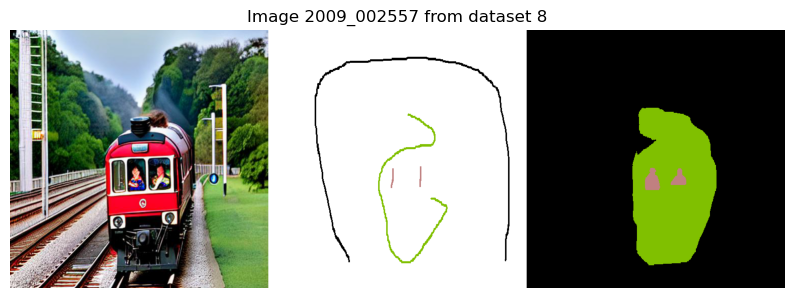

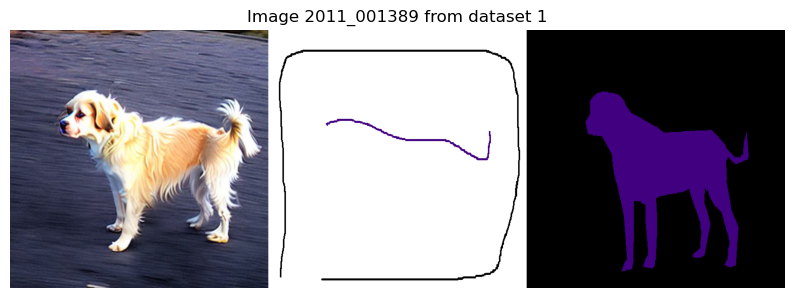

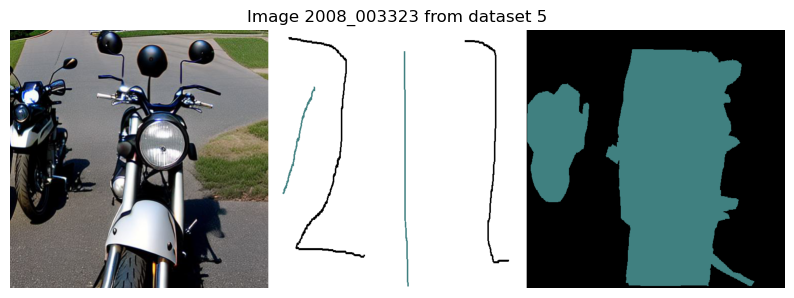

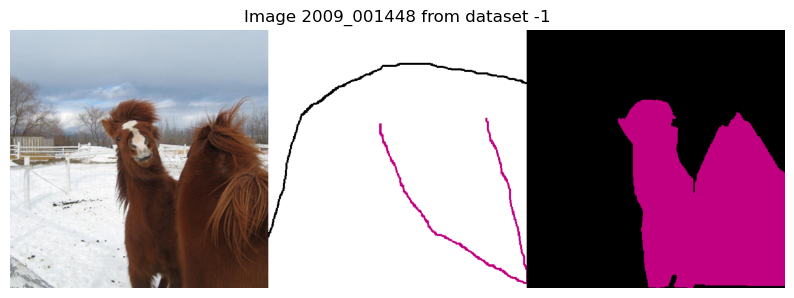

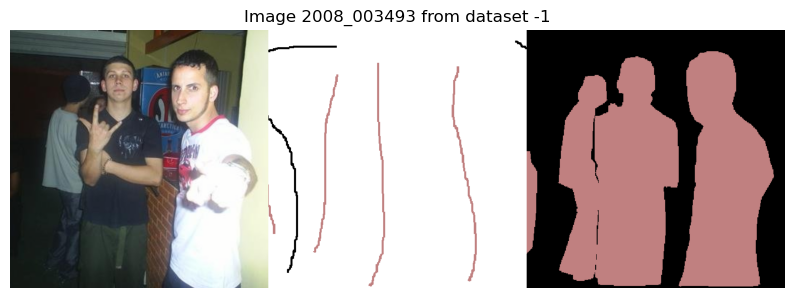

...

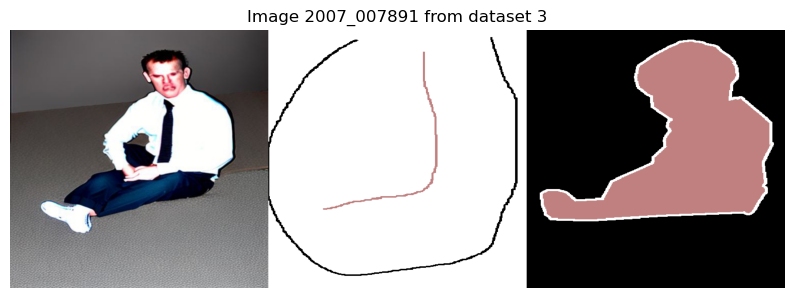

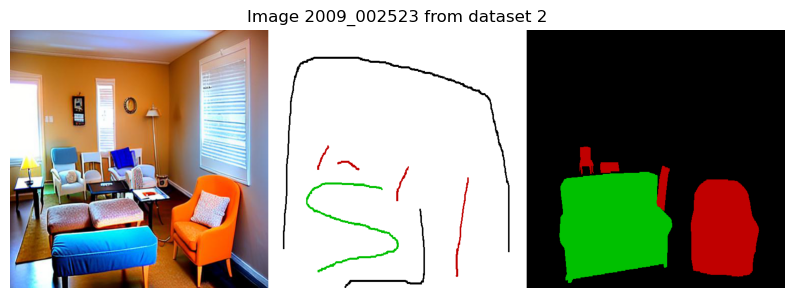

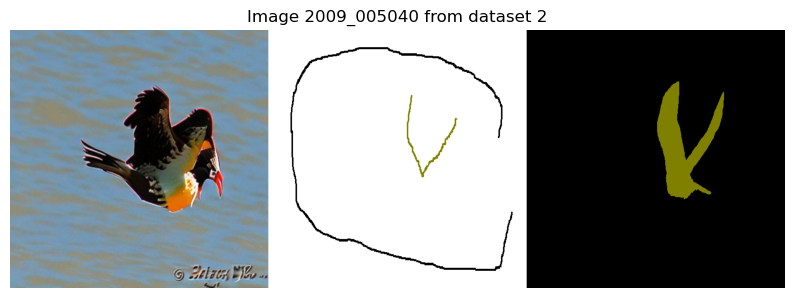

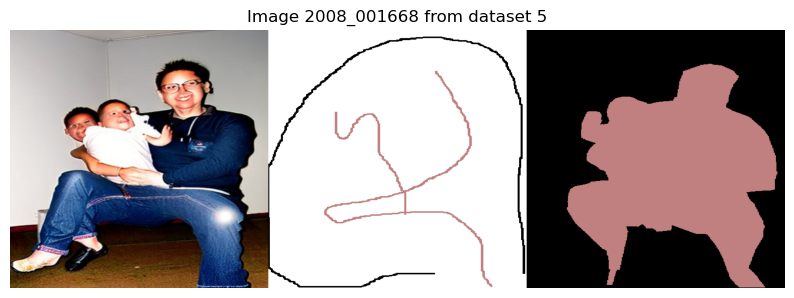

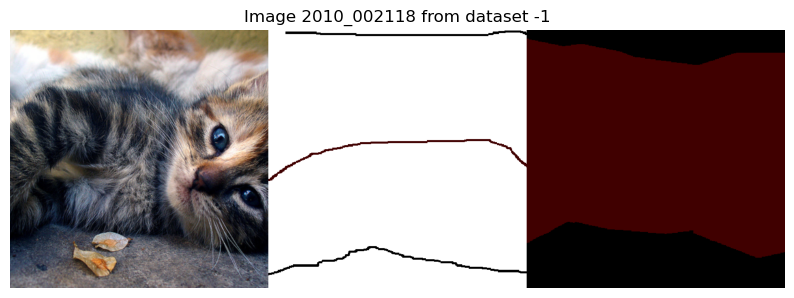

  1%|          | 9/993 [00:07<09:53,  1.66it/s]  

100%|██████████| 993/993 [03:42<00:00,  4.46it/s]


In [3]:
class temp:
    base_size = 513
    crop_size = 513
    scribbles = True
    aug_data = 'best'
    aug_best_dict = 'best_synthetic_0_4.json'
    aug_ratio = 2
    aug_use_all = False
args = temp()

voc = VOCSegmentation(args, split='train', debug=True)
dataloader = DataLoader(voc, batch_size=32, num_workers=4, shuffle=True)
dataset_nums = []
all_paths = []

c = 0
stop_viz_after = 1

print('Images in epoch:', len(dataloader) * 32)

for data in tqdm(dataloader):
    imgs, scribbles, targets, ids, datasets, paths = data['image'], data['label'], data['full_label'], data['id'], data['dataset'], data['path']
    dataset_nums += list(datasets)
    all_paths += list(paths)
    if c < stop_viz_after:
        targets[targets==254]=255
        for i in range(len(imgs)):
            img = np.moveaxis(inv_tr(imgs[i]).numpy(), 0, -1)
            scribble = decode_segmap(scribbles[i].numpy())
            target = decode_segmap(targets[i].numpy())
            plt.figure(figsize=(10,30))
            plt.title(f"Image {ids[i]} from dataset {datasets[i]}")
            plt.imshow(np.concatenate([img, scribble, target], 1))
            plt.axis('off')
            plt.show()
    c += 1

Number of images in val: 1449 (1449 are real)
Images in epoch: 1472


  0%|          | 0/46 [00:00<?, ?it/s]

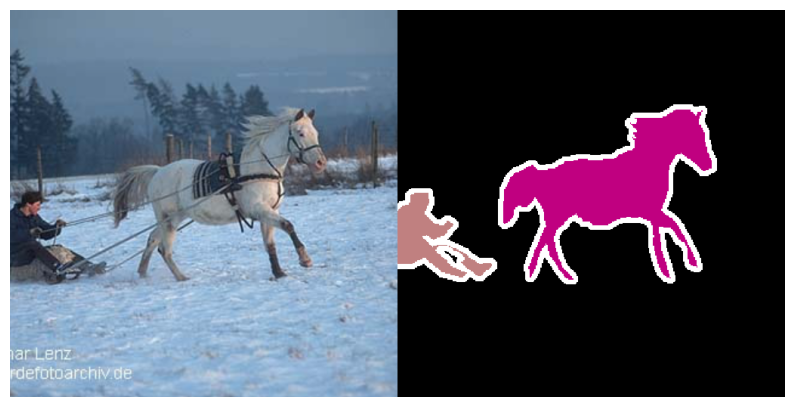

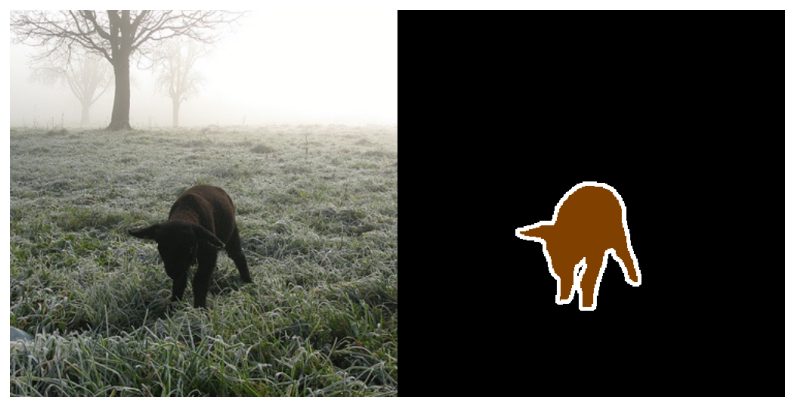

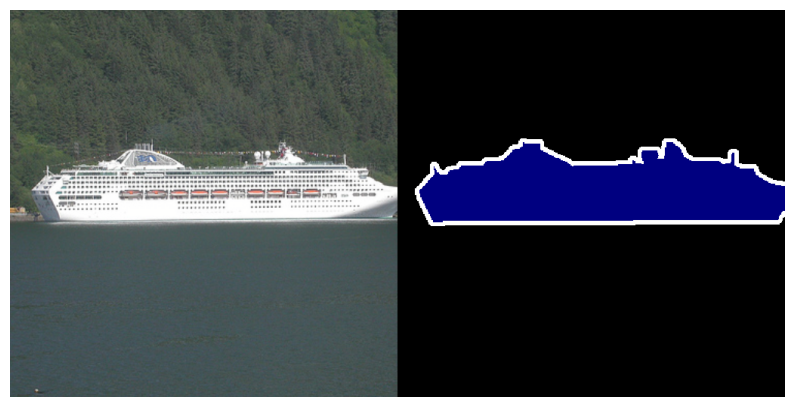

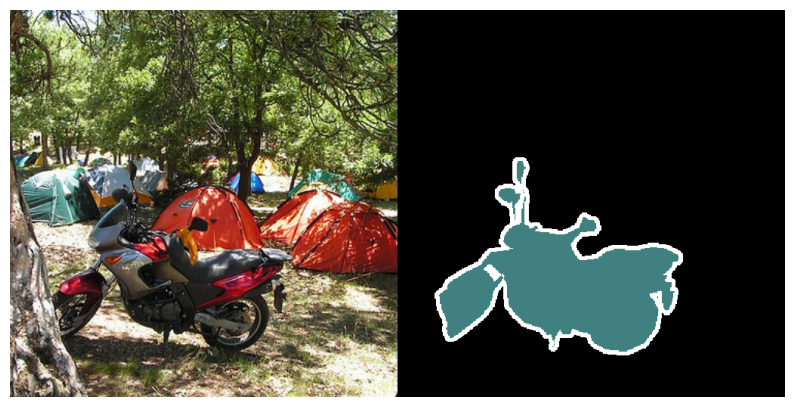

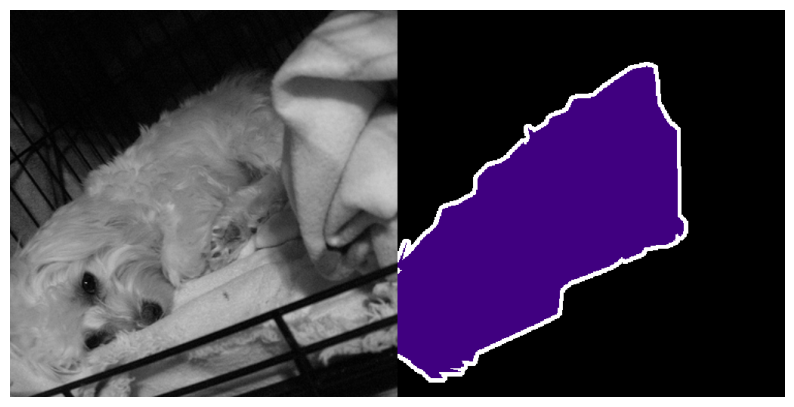

...

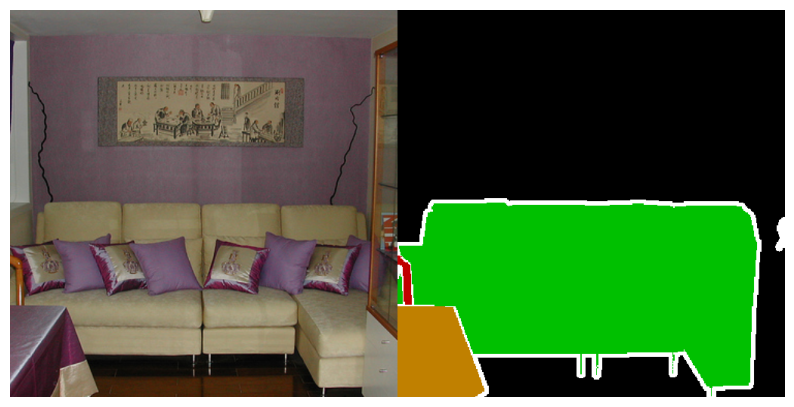

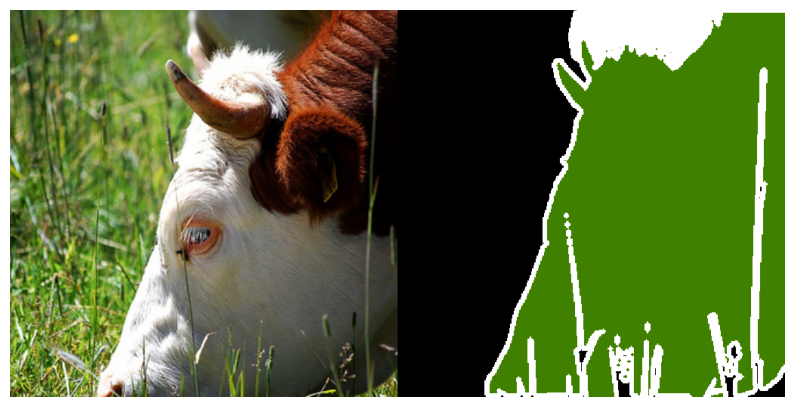

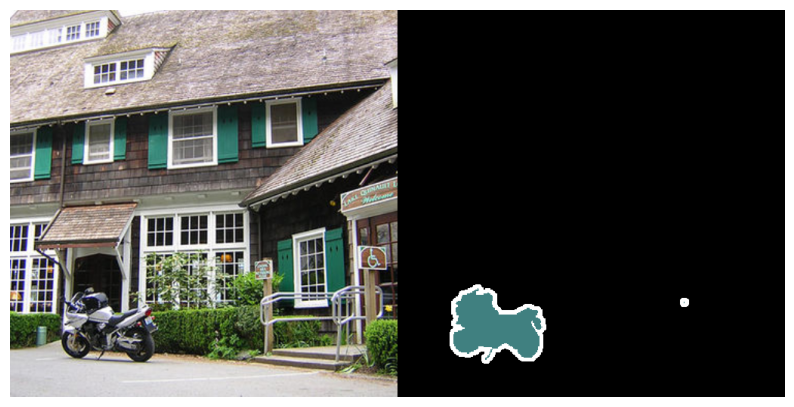

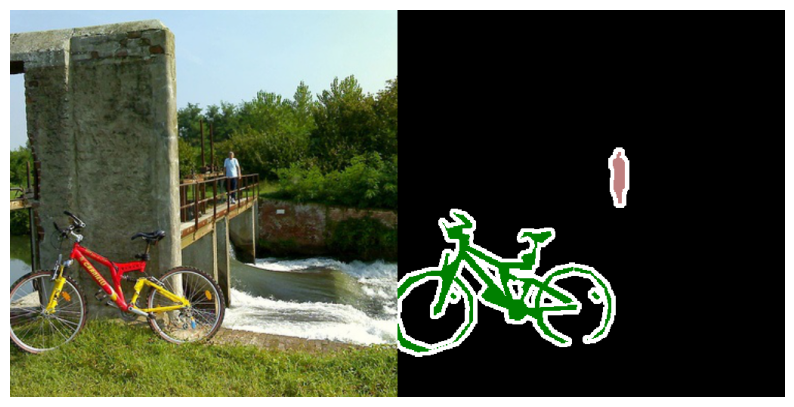

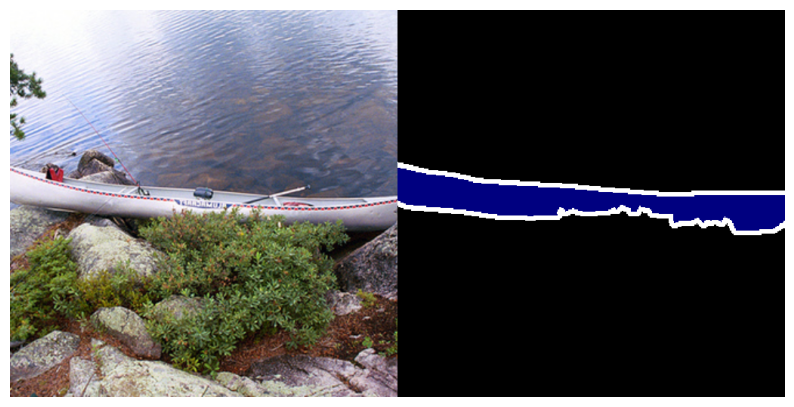

100%|██████████| 46/46 [00:15<00:00,  2.96it/s]


In [4]:
class temp:
    base_size = 513
    crop_size = 513
    scribbles = True
    aug_data = 'synth-only'
    aug_ratio = 4
    aug_use_all = False
args = temp()

voc = VOCSegmentation(args, split='val', debug=True)
dataloader = DataLoader(voc, batch_size=32, num_workers=4, shuffle=True)
dataset_nums = []
all_paths = []

c = 0
stop_viz_after = 1

print('Images in epoch:', len(dataloader) * 32)

for data in tqdm(dataloader):
    imgs, scribbles= data['image'], data['label']
    if c < stop_viz_after:
        for i in range(len(imgs)):
            img = np.moveaxis(inv_tr(imgs[i]).numpy(), 0, -1)
            scribble = decode_segmap(scribbles[i].numpy())
            plt.figure(figsize=(10,30))
            plt.imshow(np.concatenate([img, scribble], 1))
            plt.axis('off')
            plt.show()
    c += 1

In [4]:
vals, counts = np.unique(dataset_nums, return_counts=True)
print(vals, counts, counts / sum(counts))

[-1  1  2  3  4  5  6  7  8] [10582  2622  2690  2699  2672  2572  2702  2554  2653] [0.33333333 0.08259308 0.08473508 0.08501859 0.08416808 0.08101808
 0.08511309 0.08045108 0.08356958]


In [ ]:
all_paths[:100]

['/mnt/data1/PascalVOC/JPEGImages_synthetic/scribble_1/2007_000032.jpeg']